<a href="https://colab.research.google.com/github/navyamunagala/Software-Testing-Assignment/blob/master/Group1_DryBean.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Group-1 Details
*   Navya Munagla          2021CT93016
*   Karthik Ramachandran   2021CT93022
*   Banupriya J            2021CT93048   
*   Kumar Kishan           2021CT93050

#Assignment Dataset : Dry Bean dataset



#Importing the packages required

In [ ]:
# @title Default title text
import pandas as pd

import numpy as np

import seaborn as sns
sns.set(color_codes=True)

import matplotlib.pyplot as plt
%matplotlib inline

# For normalization
from sklearn.preprocessing import StandardScaler

# Import the library for handling the imbalance dataset
from imblearn.over_sampling import SMOTE

# For splitting function
from sklearn.model_selection import train_test_split

# Naive Bayes Machine learning library
from sklearn.naive_bayes import GaussianNB

# Import the metrics
from sklearn import metrics

# Import the classification_report from metrics
from sklearn.metrics import classification_report

#Import the Logistic regression library
from sklearn.linear_model import LogisticRegression

#Import of K-fold cross validation
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

#Import for regularization
from sklearn import linear_model
from sklearn.linear_model import LogisticRegression, Ridge, Lasso
from statistics import mean


#Reading the dataset

In [ ]:
dry_beans_data = pd.read_csv('/content/sample_data/Dry_Bean_Data.csv')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#Data Visualization and Exploration


In [ ]:
dry_beans_data.head(2)

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,1,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,2,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER


In [ ]:
dry_beans_data.tail(2)

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
209,210,34447,682.912,225.087411,195.329175,1.152349,0.496927,34853,209.426079,0.745784,0.988351,0.928179,0.930421,0.006534,0.003021,0.865683,0.997570,SEKER
210,211,34461,675.775,246.725439,178.157784,1.384870,0.691800,34691,209.468632,0.770181,0.993370,0.948273,0.848995,0.007160,0.002294,0.720792,0.998204,SEKER


In [ ]:
dry_beans_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211 entries, 0 to 210
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Bean ID          211 non-null    int64  
 1   Area             211 non-null    int64  
 2   Perimeter        211 non-null    float64
 3   MajorAxisLength  209 non-null    float64
 4   MinorAxisLength  208 non-null    float64
 5   AspectRation     211 non-null    float64
 6   Eccentricity     209 non-null    float64
 7   ConvexArea       211 non-null    int64  
 8   EquivDiameter    211 non-null    float64
 9   Extent           211 non-null    float64
 10  Solidity         209 non-null    float64
 11  roundness        211 non-null    float64
 12  Compactness      208 non-null    float64
 13  ShapeFactor1     208 non-null    float64
 14  ShapeFactor2     210 non-null    float64
 15  ShapeFactor3     211 non-null    float64
 16  ShapeFactor4     211 non-null    float64
 17  Class           

In [ ]:
# This gives number of Rows and colums.
dry_beans_data.shape

(211, 18)

In [ ]:
# This gives the list of columns in the given data set.
dry_beans_data.columns

Index(['Bean ID', 'Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'Class'],
      dtype='object')

In [ ]:
dry_beans_data.describe()

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,211.00000,211.000000,211.000000,209.000000,208.000000,211.000000,209.000000,211.000000,211.000000,211.000000,209.000000,211.000000,208.000000,208.000000,210.000000,211.000000,211.000000
mean,106.00000,33010.952607,660.866948,223.560748,188.267216,1.188916,0.532936,33350.815166,204.982628,0.775952,0.989790,0.949964,0.917200,0.006777,0.002964,0.841902,0.998727
std,61.05462,1150.762839,13.782522,7.158060,5.012901,0.056742,0.063934,1145.150919,3.610282,0.013237,0.002334,0.024599,0.021744,0.000184,0.000225,0.039503,0.000730
min,1.00000,28395.000000,610.291000,200.524796,171.210559,1.047160,0.296721,28715.000000,190.141097,0.739859,0.976696,0.842534,0.848240,0.006344,0.002294,0.719510,0.994199
25%,53.50000,32301.000000,653.768000,219.544082,185.291415,1.152097,0.496927,32619.000000,202.797697,0.767655,0.988843,0.940413,0.904338,0.006667,0.002830,0.819296,0.998443
50%,106.00000,33248.000000,661.138000,223.825484,188.359065,1.187375,0.539174,33565.000000,205.749042,0.775688,0.990120,0.953587,0.917175,0.006764,0.002966,0.841334,0.998905
75%,158.50000,33953.500000,669.224500,228.223182,191.371167,1.218978,0.573881,34278.000000,207.920510,0.784747,0.991503,0.967294,0.931436,0.006882,0.003110,0.867044,0.999212
max,211.00000,34461.000000,704.493000,246.725439,200.927367,1.384870,0.691800,34908.000000,209.468632,0.809797,0.993783,0.990685,0.976739,0.007474,0.003665,0.954019,0.999670


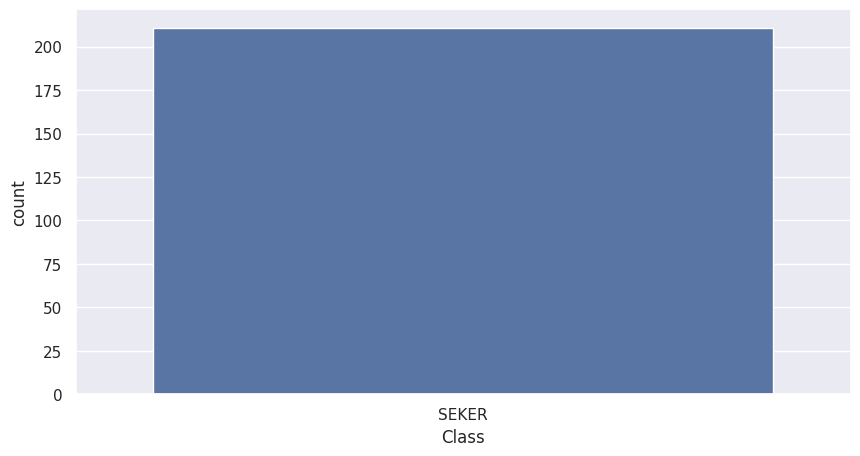

In [ ]:
# Countplot shows the count of the Class
# x-label is Class
# y-label is Count

countplt, ax = plt.subplots(figsize = (10,5))
ax = sns.countplot(x = 'Class', data = dry_beans_data)

array([[<Axes: title={'center': 'Bean ID'}>,
        <Axes: title={'center': 'Area'}>,
        <Axes: title={'center': 'Perimeter'}>,
        <Axes: title={'center': 'MajorAxisLength'}>],
       [<Axes: title={'center': 'MinorAxisLength'}>,
        <Axes: title={'center': 'AspectRation'}>,
        <Axes: title={'center': 'Eccentricity'}>,
        <Axes: title={'center': 'ConvexArea'}>],
       [<Axes: title={'center': 'EquivDiameter'}>,
        <Axes: title={'center': 'Extent'}>,
        <Axes: title={'center': 'Solidity'}>,
        <Axes: title={'center': 'roundness'}>],
       [<Axes: title={'center': 'Compactness'}>,
        <Axes: title={'center': 'ShapeFactor1'}>,
        <Axes: title={'center': 'ShapeFactor2'}>,
        <Axes: title={'center': 'ShapeFactor3'}>],
       [<Axes: title={'center': 'ShapeFactor4'}>, <Axes: >, <Axes: >,
        <Axes: >]], dtype=object)

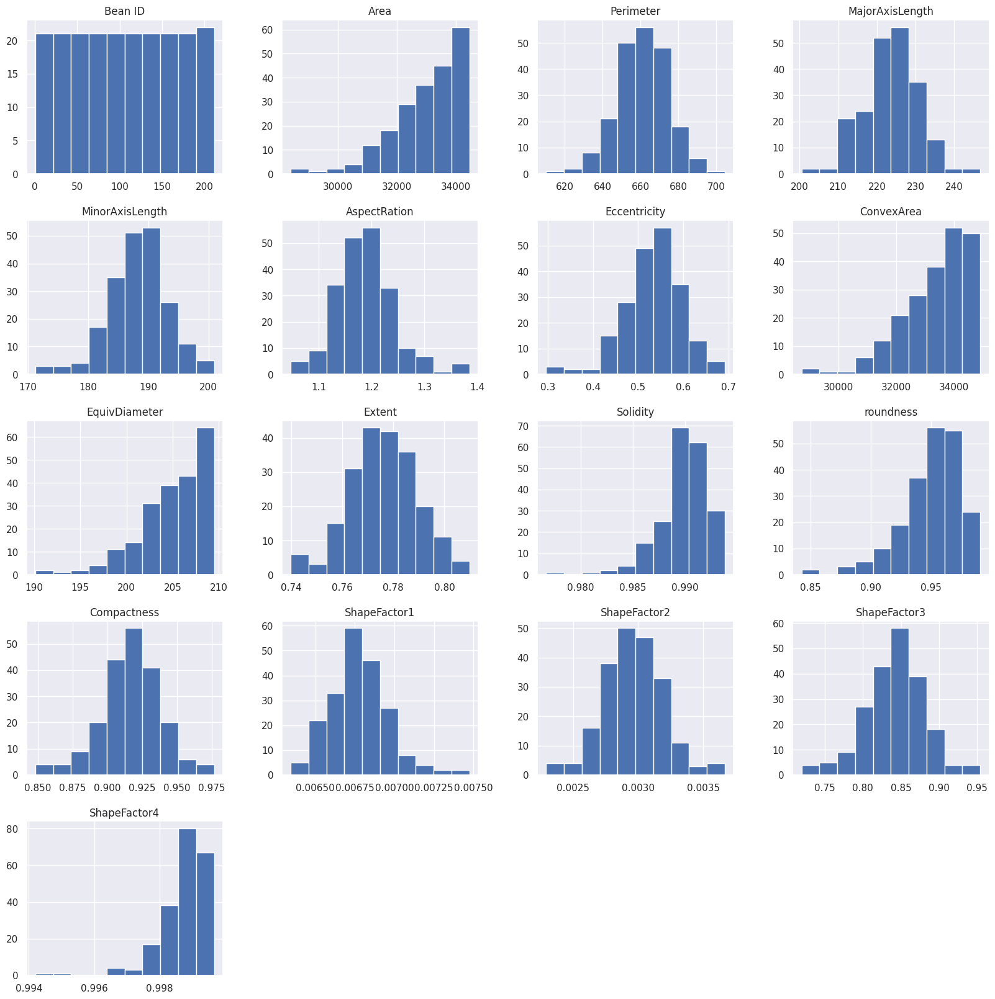

In [ ]:
# Histogram for appropriate visualization of the data set.
dry_beans_data.hist(figsize = (20, 20))

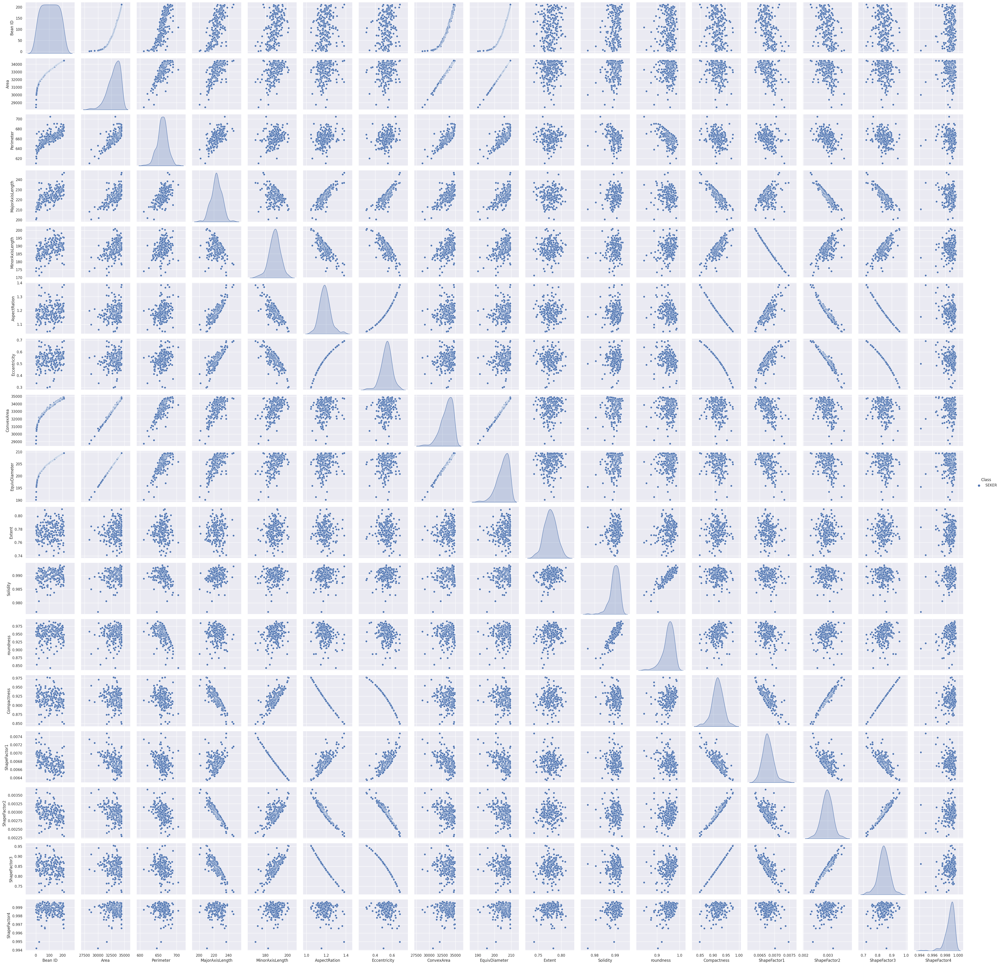

In [ ]:
# pair plot shows the relationship between the attributes
sns.pairplot(dry_beans_data, hue = "Class")

In [ ]:
# Correlation matrix is created here for feature selection.
correlationMatrix = dry_beans_data.corr()
correlationMatrix

<ipython-input-76-2ac7c44577c1>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlationMatrix = dry_beans_data.corr()


,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
Bean ID,1.000000,0.942322,0.741934,0.657817,0.459995,0.179814,0.182001,0.941823,0.937790,0.105768,0.222183,0.078209,-0.179278,-0.463228,-0.392057,-0.183429,0.026088
Area,0.942322,1.000000,0.776234,0.690809,0.496667,0.184491,0.187770,0.997864,0.999909,0.101724,0.264623,0.108014,-0.183718,-0.502963,-0.415420,-0.188060,0.066531
Perimeter,0.741934,0.776234,1.000000,0.640938,0.267422,0.281022,0.261887,0.810366,0.775722,-0.014854,-0.323668,-0.542387,-0.277370,-0.266508,-0.444005,-0.279644,-0.140249
MajorAxisLength,0.657817,0.690809,0.640938,1.000000,-0.288937,0.841804,0.829389,0.689859,0.690423,0.017500,0.170690,-0.093348,-0.845156,0.279722,-0.944693,-0.842283,-0.124664
MinorAxisLength,0.459995,0.496667,0.267422,-0.288937,1.000000,-0.763034,-0.748807,0.496392,0.497027,0.110466,0.126362,0.242044,0.768631,-0.998467,0.586780,0.761544,0.228473
AspectRation,0.179814,0.184491,0.281022,0.841804,-0.763034,1.000000,0.974824,0.183964,0.184143,-0.050125,0.046946,-0.199538,-0.998292,0.760820,-0.965743,-0.996931,-0.235776
Eccentricity,0.182001,0.187770,0.261887,0.829389,-0.748807,0.974824,1.000000,0.186823,0.187470,-0.044321,0.053868,-0.163884,-0.985650,0.739865,-0.964845,-0.988705,-0.195355
ConvexArea,0.941823,0.997864,0.810366,0.689859,0.496392,0.183964,0.186823,1.000000,0.997718,0.091657,0.200811,0.051231,-0.183306,-0.502081,-0.414553,-0.187758,0.045742
EquivDiameter,0.937790,0.999909,0.775722,0.690423,0.497027,0.184143,0.187470,0.997718,1.000000,0.101227,0.265607,0.108996,-0.183362,-0.503441,-0.415274,-0.187704,0.067779
Extent,0.105768,0.101724,-0.014854,0.017500,0.110466,-0.050125,-0.044321,0.091657,0.101227,1.000000,0.161545,0.154611,0.047963,-0.114217,0.019888,0.047606,0.070067


<Axes: >

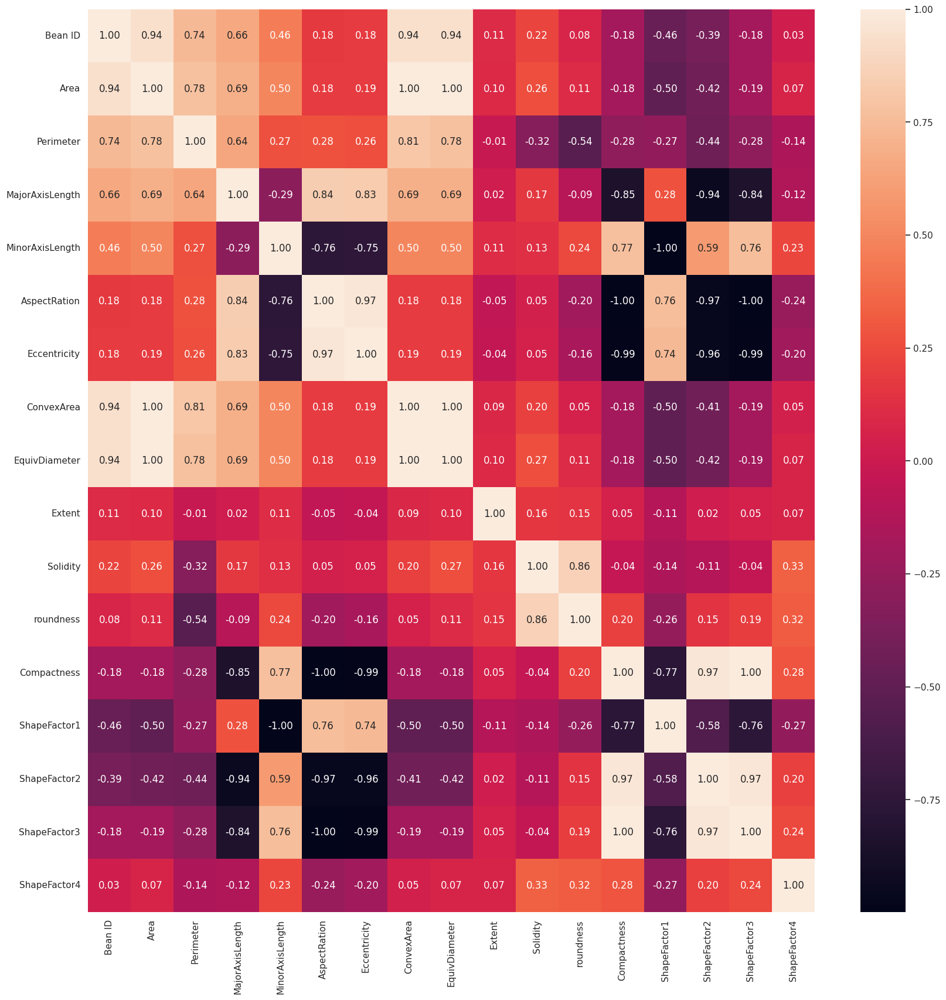

In [ ]:
fig = plt.figure(num=None, figsize=(20, 20))
sns.heatmap(correlationMatrix, annot = True, fmt='.2f')

## Data Pre-processing and Cleaning

In [ ]:
dry_beans_data.duplicated()

0      False
1      False
2      False
3      False
4      False
       ...  
206    False
207    False
208    False
209    False
210    False
Length: 211, dtype: bool

In [ ]:
dry_beans_data.isnull().sum()

Bean ID            0
Area               0
Perimeter          0
MajorAxisLength    2
MinorAxisLength    3
AspectRation       0
Eccentricity       2
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           2
roundness          0
Compactness        3
ShapeFactor1       3
ShapeFactor2       1
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

In [ ]:
unique_sets = dry_beans_data.drop_duplicates(subset = ["Bean ID","Area","Perimeter","MajorAxisLength","MinorAxisLength","AspectRation","Eccentricity","ConvexArea","EquivDiameter","Extent","Solidity","roundness",
"Compactness","ShapeFactor1","ShapeFactor2","ShapeFactor3","ShapeFactor4","Class"])
print(unique_sets)

     Bean ID   Area  Perimeter  MajorAxisLength  MinorAxisLength  \
0          1  28395    610.291       208.178117       173.888747   
1          2  28734    638.018       200.524796       182.734419   
2          3  29380    624.110       212.826130       175.931143   
3          4  30008    645.884       210.557999       182.516516   
4          5  30140    620.134       201.847882       190.279279   
..       ...    ...        ...              ...              ...   
206      207  34428    688.178       229.732498       191.379072   
207      208  34441    675.683       228.697829       191.915203   
208      209  34443    684.507       234.607330       187.572624   
209      210  34447    682.912       225.087411       195.329175   
210      211  34461    675.775       246.725439       178.157784   

     AspectRation  Eccentricity  ConvexArea  EquivDiameter    Extent  \
0        1.197191      0.549812       28715     190.141097  0.763923   
1        1.097356      0.411785       2

In [ ]:
unique_sets.shape

(211, 18)

In [ ]:
unique_sets.isnull().values.any()

True

In [ ]:
data = unique_sets[['Bean ID','Area','Perimeter','MajorAxisLength','MinorAxisLength','AspectRation','Eccentricity',
                    'ConvexArea','EquivDiameter','Extent','Solidity','roundness','Compactness',
                    'ShapeFactor1','ShapeFactor2','ShapeFactor3','ShapeFactor4','Class']].replace(0,np.nan)
data.head(18)

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,1,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,2,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,3,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,4,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,NaN,0.007017,0.003215,0.861794,0.994199,SEKER
4,5,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
5,6,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.989510,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236,SEKER
6,7,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,0.984081,0.853080,0.933374,0.006925,0.003242,0.871186,0.999049,SEKER
7,8,30519,629.727,212.996755,NaN,1.165591,0.513760,30847,197.124320,0.770682,0.989367,0.967109,0.925480,0.006979,0.003158,0.856514,0.998345,SEKER
8,9,30685,635.681,213.534145,183.157146,1.165852,0.514081,31044,197.659696,0.771561,0.988436,0.954240,0.925658,0.006959,0.003152,0.856844,0.998953,SEKER
9,10,30834,631.934,217.227813,180.897469,1.200834,0.553642,31120,198.139012,0.783683,0.990810,0.970278,0.912125,0.007045,0.003008,0.831973,0.999061,SEKER


In [ ]:
data.describe()

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,211.00000,211.000000,211.000000,209.000000,208.000000,211.000000,209.000000,211.000000,211.000000,211.000000,209.000000,211.000000,208.000000,208.000000,210.000000,211.000000,211.000000
mean,106.00000,33010.952607,660.866948,223.560748,188.267216,1.188916,0.532936,33350.815166,204.982628,0.775952,0.989790,0.949964,0.917200,0.006777,0.002964,0.841902,0.998727
std,61.05462,1150.762839,13.782522,7.158060,5.012901,0.056742,0.063934,1145.150919,3.610282,0.013237,0.002334,0.024599,0.021744,0.000184,0.000225,0.039503,0.000730
min,1.00000,28395.000000,610.291000,200.524796,171.210559,1.047160,0.296721,28715.000000,190.141097,0.739859,0.976696,0.842534,0.848240,0.006344,0.002294,0.719510,0.994199
25%,53.50000,32301.000000,653.768000,219.544082,185.291415,1.152097,0.496927,32619.000000,202.797697,0.767655,0.988843,0.940413,0.904338,0.006667,0.002830,0.819296,0.998443
50%,106.00000,33248.000000,661.138000,223.825484,188.359065,1.187375,0.539174,33565.000000,205.749042,0.775688,0.990120,0.953587,0.917175,0.006764,0.002966,0.841334,0.998905
75%,158.50000,33953.500000,669.224500,228.223182,191.371167,1.218978,0.573881,34278.000000,207.920510,0.784747,0.991503,0.967294,0.931436,0.006882,0.003110,0.867044,0.999212
max,211.00000,34461.000000,704.493000,246.725439,200.927367,1.384870,0.691800,34908.000000,209.468632,0.809797,0.993783,0.990685,0.976739,0.007474,0.003665,0.954019,0.999670


In [ ]:
#median

data['Bean ID'].fillna(data['Bean ID'].median(),inplace=True)
data['Area'].fillna(data['Area'].median(),inplace=True)
data['Perimeter'].fillna(data['Perimeter'].median(),inplace=True)
data['MajorAxisLength'].fillna(data['MajorAxisLength'].median(),inplace=True)
data['MinorAxisLength'].fillna(data['MinorAxisLength'].median(),inplace=True)
data['AspectRation'].fillna(data['AspectRation'].median(),inplace=True)
data['Eccentricity'].fillna(data['Eccentricity'].median(),inplace=True)
data['ConvexArea'].fillna(data['ConvexArea'].median(),inplace=True)
data['Extent'].fillna(data['Extent'].median(),inplace=True)
data['EquivDiameter'].fillna(data['EquivDiameter'].median(),inplace=True)
data['Solidity'].fillna(data['Solidity'].median(),inplace=True)
data['roundness'].fillna(data['roundness'].median(),inplace=True)
data['Compactness'].fillna(data['Compactness'].median(),inplace=True)
data['ShapeFactor1'].fillna(data['ShapeFactor1'].median(),inplace=True)
data['ShapeFactor2'].fillna(data['ShapeFactor2'].median(),inplace=True)
data['ShapeFactor3'].fillna(data['ShapeFactor3'].median(),inplace=True)
data['ShapeFactor4'].fillna(data['ShapeFactor4'].median(),inplace=True)

In [ ]:
data.head(18)

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,1,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,2,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,3,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,4,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.917175,0.007017,0.003215,0.861794,0.994199,SEKER
4,5,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
5,6,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.989510,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236,SEKER
6,7,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,0.984081,0.853080,0.933374,0.006925,0.003242,0.871186,0.999049,SEKER
7,8,30519,629.727,212.996755,188.359065,1.165591,0.513760,30847,197.124320,0.770682,0.989367,0.967109,0.925480,0.006979,0.003158,0.856514,0.998345,SEKER
8,9,30685,635.681,213.534145,183.157146,1.165852,0.514081,31044,197.659696,0.771561,0.988436,0.954240,0.925658,0.006959,0.003152,0.856844,0.998953,SEKER
9,10,30834,631.934,217.227813,180.897469,1.200834,0.553642,31120,198.139012,0.783683,0.990810,0.970278,0.912125,0.007045,0.003008,0.831973,0.999061,SEKER


In [ ]:
data.describe()

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,211.00000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000
mean,106.00000,33010.952607,660.866948,223.563258,188.268522,1.188916,0.532995,33350.815166,204.982628,0.775952,0.989793,0.949964,0.917200,0.006777,0.002964,0.841902,0.998727
std,61.05462,1150.762839,13.782522,7.123939,4.976977,0.056742,0.063632,1145.150919,3.610282,0.013237,0.002323,0.024599,0.021588,0.000183,0.000224,0.039503,0.000730
min,1.00000,28395.000000,610.291000,200.524796,171.210559,1.047160,0.296721,28715.000000,190.141097,0.739859,0.976696,0.842534,0.848240,0.006344,0.002294,0.719510,0.994199
25%,53.50000,32301.000000,653.768000,219.647329,185.371842,1.152097,0.496970,32619.000000,202.797697,0.767655,0.988844,0.940413,0.905149,0.006668,0.002830,0.819296,0.998443
50%,106.00000,33248.000000,661.138000,223.825484,188.359065,1.187375,0.539174,33565.000000,205.749042,0.775688,0.990120,0.953587,0.917175,0.006764,0.002966,0.841334,0.998905
75%,158.50000,33953.500000,669.224500,228.186178,191.361507,1.218978,0.571839,34278.000000,207.920510,0.784747,0.991496,0.967294,0.931152,0.006881,0.003110,0.867044,0.999212
max,211.00000,34461.000000,704.493000,246.725439,200.927367,1.384870,0.691800,34908.000000,209.468632,0.809797,0.993783,0.990685,0.976739,0.007474,0.003665,0.954019,0.999670


In [ ]:
data.head(18)


,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,1,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,2,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272751,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,3,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,4,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.917175,0.007017,0.003215,0.861794,0.994199,SEKER
4,5,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
5,6,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.989510,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236,SEKER
6,7,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,0.984081,0.853080,0.933374,0.006925,0.003242,0.871186,0.999049,SEKER
7,8,30519,629.727,212.996755,188.359065,1.165591,0.513760,30847,197.124320,0.770682,0.989367,0.967109,0.925480,0.006979,0.003158,0.856514,0.998345,SEKER
8,9,30685,635.681,213.534145,183.157146,1.165852,0.514081,31044,197.659696,0.771561,0.988436,0.954240,0.925658,0.006959,0.003152,0.856844,0.998953,SEKER
9,10,30834,631.934,217.227813,180.897469,1.200834,0.553642,31120,198.139012,0.783683,0.990810,0.970278,0.912125,0.007045,0.003008,0.831973,0.999061,SEKER


# Outliers

In [ ]:
#import matplotlib.pyplot as plt
%matplotlib inline

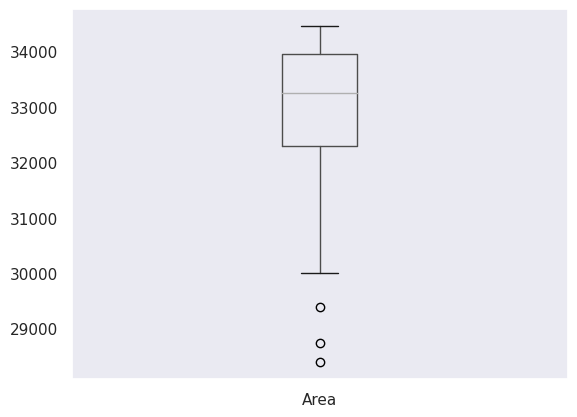

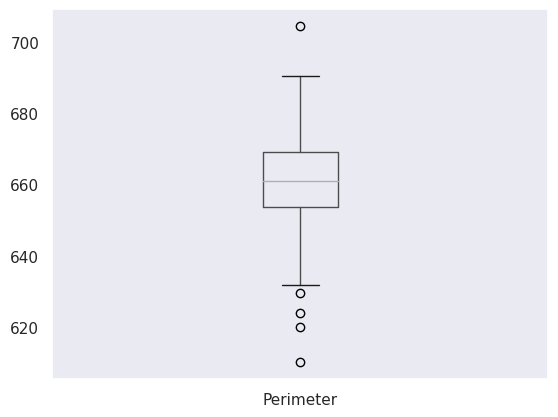

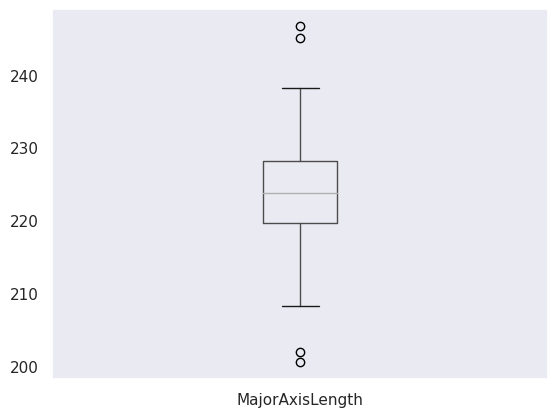

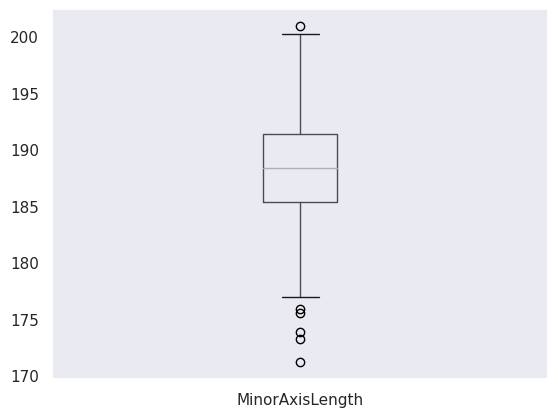

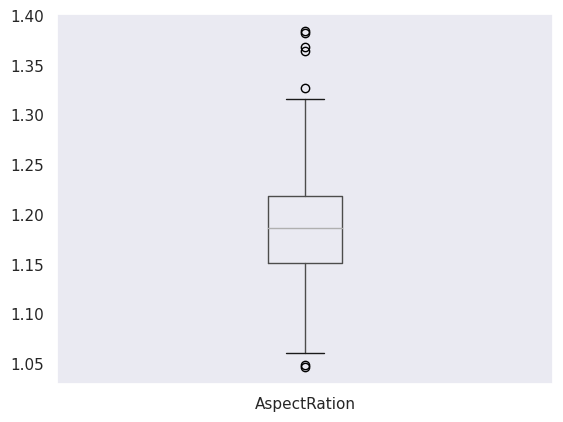

...

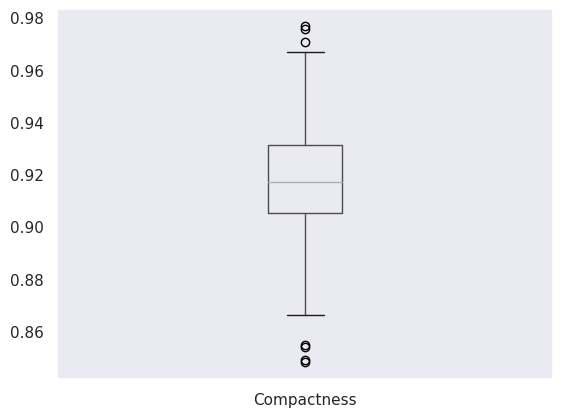

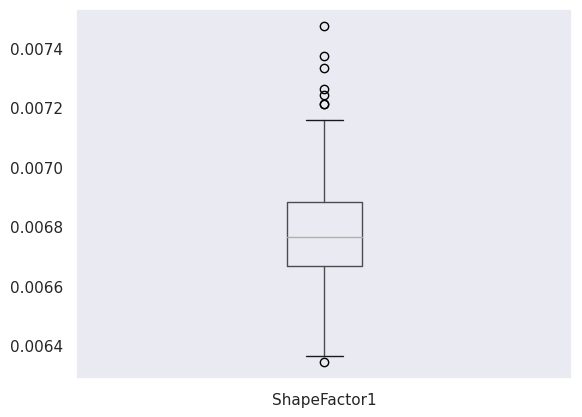

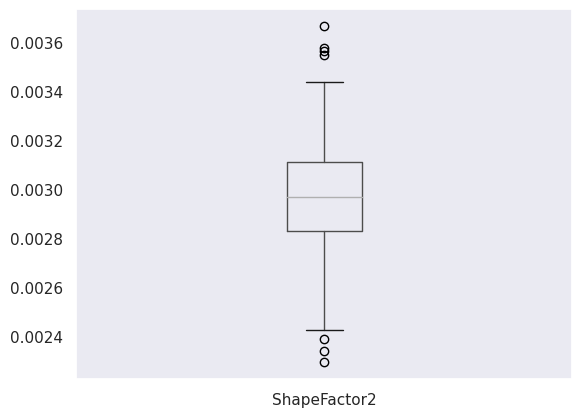

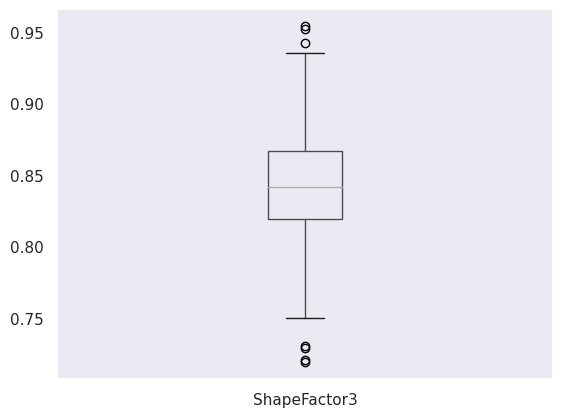

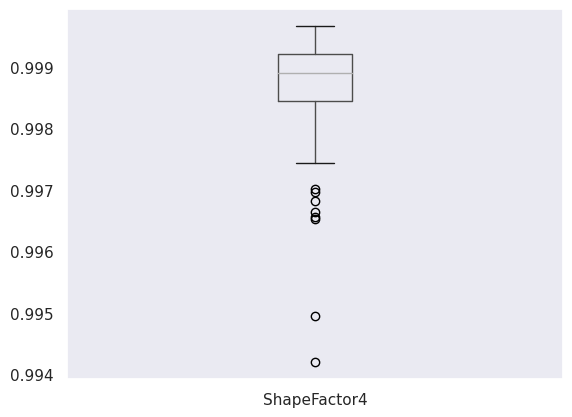

In [ ]:
# define a function called "plot_boxplot"
# to check the outliers in dataset

def plot_boxplot(df, columns):
  df.boxplot(column=[columns])
  plt.grid(False)
  plt.show()


plot_boxplot(data , "Area")
plot_boxplot(data , "Perimeter")
plot_boxplot(data , "MajorAxisLength")
plot_boxplot(data , "MinorAxisLength")
plot_boxplot(data , "AspectRation")
plot_boxplot(data , "Eccentricity")
plot_boxplot(data , "ConvexArea")
plot_boxplot(data , "EquivDiameter")
plot_boxplot(data , "Extent")
plot_boxplot(data , "Solidity")
plot_boxplot(data , "Compactness")
plot_boxplot(data , "ShapeFactor1")
plot_boxplot(data , "ShapeFactor2")
plot_boxplot(data , "ShapeFactor3")
plot_boxplot(data , "ShapeFactor4")


#remove outliers

In [ ]:
data.describe()

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,211.00000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000,211.000000
mean,106.00000,33010.952607,660.866948,223.563258,188.268522,1.188916,0.532995,33350.815166,204.982628,0.775952,0.989793,0.949964,0.917200,0.006777,0.002964,0.841902,0.998727
std,61.05462,1150.762839,13.782522,7.123939,4.976977,0.056742,0.063632,1145.150919,3.610282,0.013237,0.002323,0.024599,0.021588,0.000183,0.000224,0.039503,0.000730
min,1.00000,28395.000000,610.291000,200.524796,171.210559,1.047160,0.296721,28715.000000,190.141097,0.739859,0.976696,0.842534,0.848240,0.006344,0.002294,0.719510,0.994199
25%,53.50000,32301.000000,653.768000,219.647329,185.371842,1.152097,0.496970,32619.000000,202.797697,0.767655,0.988844,0.940413,0.905149,0.006668,0.002830,0.819296,0.998443
50%,106.00000,33248.000000,661.138000,223.825484,188.359065,1.187375,0.539174,33565.000000,205.749042,0.775688,0.990120,0.953587,0.917175,0.006764,0.002966,0.841334,0.998905
75%,158.50000,33953.500000,669.224500,228.186178,191.361507,1.218978,0.571839,34278.000000,207.920510,0.784747,0.991496,0.967294,0.931152,0.006881,0.003110,0.867044,0.999212
max,211.00000,34461.000000,704.493000,246.725439,200.927367,1.384870,0.691800,34908.000000,209.468632,0.809797,0.993783,0.990685,0.976739,0.007474,0.003665,0.954019,0.999670


In [ ]:
# define a funtion called outliers which returns a list of index of outliers
# IQR = Q3-Q1
# +/- 1.5*IQR

def outliers(df, columns):
  Q1 = df[columns].quantile(0.25)
  Q3 = df[columns].quantile(0.75)
  IQR = Q3 - Q1

  lower_bound = Q1 - 1.5 * IQR
  upper_bound = Q3 + 1.5 * IQR

  ls = df.index[(df[columns] < lower_bound) | (df[columns] > upper_bound)]
  return ls


In [ ]:
# create am empty list to store the output indices from multiple columns

index_list = []
for drybean in ['Area','MajorAxisLength','MinorAxisLength','AspectRation','Eccentricity']:
   index_list.extend(outliers(data, drybean))

In [ ]:
index_list

[0,
 1,
 2,
 1,
 4,
 197,
 210,
 0,
 2,
 23,
 24,
 42,
 104,
 24,
 42,
 67,
 85,
 104,
 197,
 210,
 4,
 24,
 85,
 104,
 131,
 136,
 210]

In [ ]:
# to remove outliers from data set

def remove(df, ls):
  ls = sorted(set(ls))
  df = df.drop(ls)
  return df

In [ ]:
clean_data = remove(data, index_list)

In [ ]:
clean_data.shape

(197, 18)

In [ ]:
#Splitting the area of the dataset into 4 bins of Area Groups and applying discretization to transform the continuos data into discrete values by grouping it.

clean_data['size_cat'] = pd.cut(x= clean_data['Area'],bins = 4 ,labels = ['Tiny','Small','Medium','Big'] )
clean_data['size_cat'].value_counts()

Big       94
Medium    62
Small     32
Tiny       9
Name: size_cat, dtype: int64

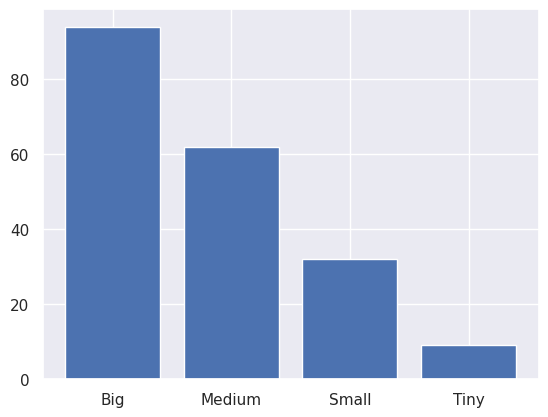

In [ ]:
# Method to draw bar plot for the data set
def draw_barplot(x):
  s = x.value_counts()
  plt.bar( s.index,s.values)
size_cat = draw_barplot(clean_data['size_cat'])

In [ ]:
# Applying feature engineering technique - Discretization to tranform continuos numerical data by mapping values to interval concept labels.
# This helps to maintain the data easily.Training a model with discrete data beocmes faster than with the continuos data
# Main challenge in Discretization lies in choosing the number of intervals or bins
# Applying Equal width Discretization to separate possible values into 'N' number of bins ,each having same width which can be done by KBinsDiscretizer


from sklearn.preprocessing import KBinsDiscretizer
discretizer = KBinsDiscretizer(n_bins=4 , encode = 'ordinal' , strategy = 'uniform')
clean_data['Area_uniform_discrete']= discretizer.fit_transform(clean_data['Area'].values.reshape(-1,1)).astype(int)
clean_data.head()

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class,size_cat,Area_uniform_discrete
3,4,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.917175,0.007017,0.003215,0.861794,0.994199,SEKER,Tiny,0
5,6,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.989510,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236,SEKER,Tiny,0
6,7,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,0.984081,0.853080,0.933374,0.006925,0.003242,0.871186,0.999049,SEKER,Tiny,0
7,8,30519,629.727,212.996755,188.359065,1.165591,0.513760,30847,197.124320,0.770682,0.989367,0.967109,0.925480,0.006979,0.003158,0.856514,0.998345,SEKER,Tiny,0
8,9,30685,635.681,213.534145,183.157146,1.165852,0.514081,31044,197.659696,0.771561,0.988436,0.954240,0.925658,0.006959,0.003152,0.856844,0.998953,SEKER,Tiny,0


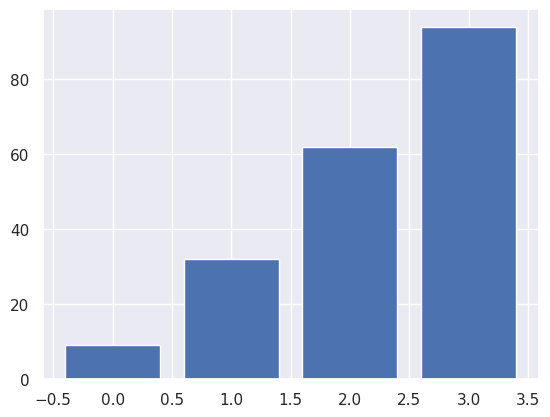

In [ ]:
draw_barplot(clean_data['Area_uniform_discrete'])

In [ ]:
discretizer.bin_edges_

array([array([30008.  , 31117.75, 32227.5 , 33337.25, 34447.  ])],
      dtype=object)

In [ ]:
# Applying Equal frequency discretization where data points will be same but the width might differ
discretizer = KBinsDiscretizer(n_bins=4 , encode = 'ordinal' , strategy = 'quantile')
clean_data['Area_eq_freq']= discretizer.fit_transform(clean_data['Area'].values.reshape(-1,1)).astype(int)
clean_data.head()

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,...,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class,size_cat,Area_uniform_discrete,Area_eq_freq
3,4,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,...,0.903936,0.917175,0.007017,0.003215,0.861794,0.994199,SEKER,Tiny,0,0
5,6,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,...,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236,SEKER,Tiny,0,0
6,7,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,...,0.853080,0.933374,0.006925,0.003242,0.871186,0.999049,SEKER,Tiny,0,0
7,8,30519,629.727,212.996755,188.359065,1.165591,0.513760,30847,197.124320,0.770682,...,0.967109,0.925480,0.006979,0.003158,0.856514,0.998345,SEKER,Tiny,0,0
8,9,30685,635.681,213.534145,183.157146,1.165852,0.514081,31044,197.659696,0.771561,...,0.954240,0.925658,0.006959,0.003152,0.856844,0.998953,SEKER,Tiny,0,0


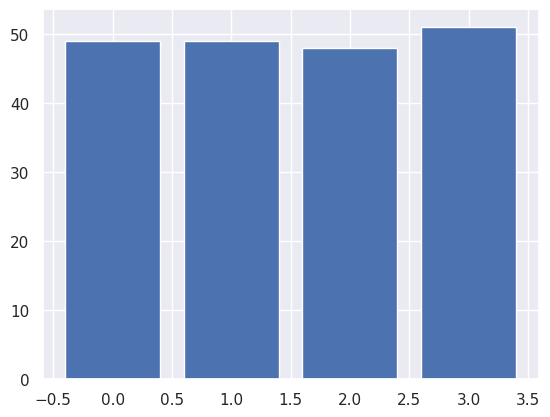

In [ ]:
Area_eq_freq = draw_barplot(clean_data['Area_eq_freq'])

In [ ]:
discretizer.bin_edges_

array([array([30008., 32368., 33316., 33961., 34447.])], dtype=object)

In [ ]:
#Applying Cluster algorithm to convert continous variable to discrete variable

discretizer = KBinsDiscretizer(n_bins=4 , encode = 'ordinal' , strategy = 'kmeans')
clean_data['Area_kmeans_discrete']= discretizer.fit_transform(clean_data['Area'].values.reshape(-1,1)).astype(int)
clean_data.head()


,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,...,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class,size_cat,Area_uniform_discrete,Area_eq_freq,Area_kmeans_discrete
3,4,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,...,0.917175,0.007017,0.003215,0.861794,0.994199,SEKER,Tiny,0,0,0
5,6,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,...,0.923726,0.007020,0.003153,0.853270,0.999236,SEKER,Tiny,0,0,0
6,7,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,...,0.933374,0.006925,0.003242,0.871186,0.999049,SEKER,Tiny,0,0,0
7,8,30519,629.727,212.996755,188.359065,1.165591,0.513760,30847,197.124320,0.770682,...,0.925480,0.006979,0.003158,0.856514,0.998345,SEKER,Tiny,0,0,0
8,9,30685,635.681,213.534145,183.157146,1.165852,0.514081,31044,197.659696,0.771561,...,0.925658,0.006959,0.003152,0.856844,0.998953,SEKER,Tiny,0,0,0


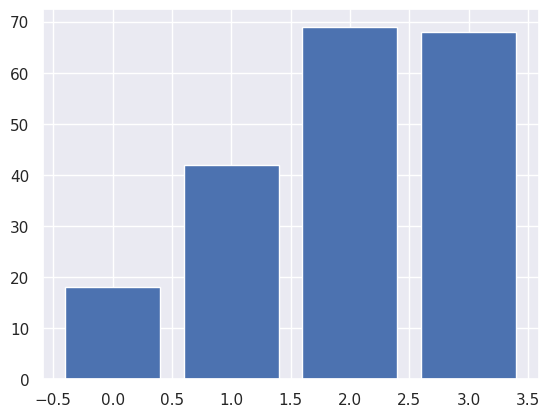

In [ ]:
draw_barplot(clean_data['Area_kmeans_discrete'])

In [ ]:
clean_data_set = clean_data.drop(['Class', 'size_cat'], axis=1)
clean_data_set

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Area_uniform_discrete,Area_eq_freq,Area_kmeans_discrete
3,4,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.917175,0.007017,0.003215,0.861794,0.994199,0,0,0
5,6,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.989510,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236,0,0,0
6,7,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,0.984081,0.853080,0.933374,0.006925,0.003242,0.871186,0.999049,0,0,0
7,8,30519,629.727,212.996755,188.359065,1.165591,0.513760,30847,197.124320,0.770682,0.989367,0.967109,0.925480,0.006979,0.003158,0.856514,0.998345,0,0,0
8,9,30685,635.681,213.534145,183.157146,1.165852,0.514081,31044,197.659696,0.771561,0.988436,0.954240,0.925658,0.006959,0.003152,0.856844,0.998953,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
205,206,34425,680.503,232.645667,188.554405,1.233838,0.585768,34791,209.359192,0.758929,0.989480,0.934165,0.899906,0.006758,0.002734,0.809831,0.999200,3,3,3
206,207,34428,688.178,229.732498,191.379072,1.200406,0.553195,34908,209.368314,0.777770,0.986250,0.913524,0.911357,0.006673,0.002840,0.830572,0.997023,3,3,3
207,208,34441,675.683,228.697829,191.915203,1.191661,0.543877,34826,209.407839,0.790874,0.988945,0.947981,0.915653,0.006640,0.002879,0.838420,0.999113,3,3,3
208,209,34443,684.507,234.607330,187.572624,1.250755,0.600643,34874,209.413919,0.784650,0.987641,0.923751,0.892615,0.006764,0.002667,0.796761,0.996552,3,3,3


In [ ]:
#Applying Normalisation to convert the values within the minimum valie of 0 and max value of 1
from sklearn.preprocessing import MinMaxScaler
Scaler = MinMaxScaler()
df_normalised = Scaler.fit_transform(clean_data_set)
print(df_normalised)
clean_data_set

[[0.         0.         0.2161009  ... 0.         0.         0.        ]
 [0.00970874 0.06104979 0.06955033 ... 0.         0.         0.        ]
 [0.01456311 0.10565443 0.53909531 ... 0.         0.         0.        ]
 ...
 [0.99029126 0.99864834 0.61466442 ... 1.         1.         1.        ]
 [0.99514563 0.9990989  0.73268598 ... 1.         1.         1.        ]
 [1.         1.         0.71135275 ... 1.         1.         1.        ]]


,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Area_uniform_discrete,Area_eq_freq,Area_kmeans_discrete
3,4,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.917175,0.007017,0.003215,0.861794,0.994199,0,0,0
5,6,30279,634.927,212.560556,181.510182,1.171067,0.520401,30600,196.347702,0.775688,0.989510,0.943852,0.923726,0.007020,0.003153,0.853270,0.999236,0,0,0
6,7,30477,670.033,211.050155,184.039050,1.146768,0.489478,30970,196.988633,0.762402,0.984081,0.853080,0.933374,0.006925,0.003242,0.871186,0.999049,0,0,0
7,8,30519,629.727,212.996755,188.359065,1.165591,0.513760,30847,197.124320,0.770682,0.989367,0.967109,0.925480,0.006979,0.003158,0.856514,0.998345,0,0,0
8,9,30685,635.681,213.534145,183.157146,1.165852,0.514081,31044,197.659696,0.771561,0.988436,0.954240,0.925658,0.006959,0.003152,0.856844,0.998953,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
205,206,34425,680.503,232.645667,188.554405,1.233838,0.585768,34791,209.359192,0.758929,0.989480,0.934165,0.899906,0.006758,0.002734,0.809831,0.999200,3,3,3
206,207,34428,688.178,229.732498,191.379072,1.200406,0.553195,34908,209.368314,0.777770,0.986250,0.913524,0.911357,0.006673,0.002840,0.830572,0.997023,3,3,3
207,208,34441,675.683,228.697829,191.915203,1.191661,0.543877,34826,209.407839,0.790874,0.988945,0.947981,0.915653,0.006640,0.002879,0.838420,0.999113,3,3,3
208,209,34443,684.507,234.607330,187.572624,1.250755,0.600643,34874,209.413919,0.784650,0.987641,0.923751,0.892615,0.006764,0.002667,0.796761,0.996552,3,3,3


In [ ]:
# df_normalised = pd.DataFrame(df_normalised,columns = ['Id','Area','Perimeter','MajorAxisLength','MinorAxisLength','AspectRation','Eccentricity','ConvexArea','EquivDiameter','Extent	Solidity','roundness','Compactness','ShapeFactor1','ShapeFactor2','ShapeFactor3','ShapeFactor4','Class','size_cat','Area_uniform_discrete','Area_eq_freq'])
allColumns = ['Bean ID', 'Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'Area_uniform_discrete', 'Area_eq_freq',
       'Area_kmeans_discrete']

df_normalised = pd.DataFrame(df_normalised,columns = allColumns)
# df_normalised.drop(['size_cat','Area_uniform_discrete','Area_eq_freq'], axis = 1, inplace = True)
df_normalised.shape
filteredDataSet = df_normalised.join(dry_beans_data.filter(['Class'], axis = 1))
filteredDataSet

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,...,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Area_uniform_discrete,Area_eq_freq,Area_kmeans_discrete,Class
0,0.000000,0.000000,0.216101,0.018177,0.263777,0.272716,0.386888,0.028784,0.000000,0.612292,...,0.414456,0.540843,0.747228,0.774533,0.661835,0.000000,0.0,0.0,0.0,SEKER
1,0.009709,0.061050,0.069550,0.089226,0.216246,0.350555,0.474890,0.000000,0.063088,0.512306,...,0.683879,0.617924,0.751541,0.706321,0.606944,0.920559,0.0,0.0,0.0,SEKER
2,0.014563,0.105654,0.539095,0.035638,0.335690,0.242035,0.349974,0.085887,0.109003,0.322323,...,0.071181,0.731443,0.628501,0.804843,0.722307,0.886374,0.0,0.0,0.0,SEKER
3,0.019417,0.115116,0.000000,0.104702,0.539733,0.326097,0.448062,0.057335,0.118723,0.440719,...,0.840864,0.638568,0.698645,0.712400,0.627834,0.757678,0.0,0.0,0.0,SEKER
4,0.024272,0.152512,0.079635,0.123768,0.294036,0.327265,0.449360,0.103064,0.157077,0.453297,...,0.753997,0.640664,0.672474,0.704965,0.629957,0.868874,0.0,0.0,0.0,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192,0.980583,0.995044,0.679132,0.801828,0.548960,0.630898,0.738946,0.972841,0.995208,0.272666,...,0.618497,0.337646,0.412774,0.243904,0.327245,0.914016,1.0,1.0,1.0,SEKER
193,0.985437,0.995720,0.781786,0.698472,0.682375,0.481584,0.607365,1.000000,0.995862,0.542072,...,0.479173,0.472385,0.302612,0.360466,0.460794,0.516087,1.0,1.0,1.0,SEKER
194,0.990291,0.998648,0.614664,0.661762,0.707697,0.442529,0.569724,0.980966,0.998693,0.729441,...,0.711751,0.522934,0.260514,0.404408,0.511331,0.898052,1.0,1.0,1.0,SEKER
195,0.995146,0.999099,0.732686,0.871427,0.502588,0.706447,0.799036,0.992108,0.999129,0.640443,...,0.548203,0.251853,0.420042,0.170360,0.243090,0.430106,1.0,1.0,1.0,SEKER


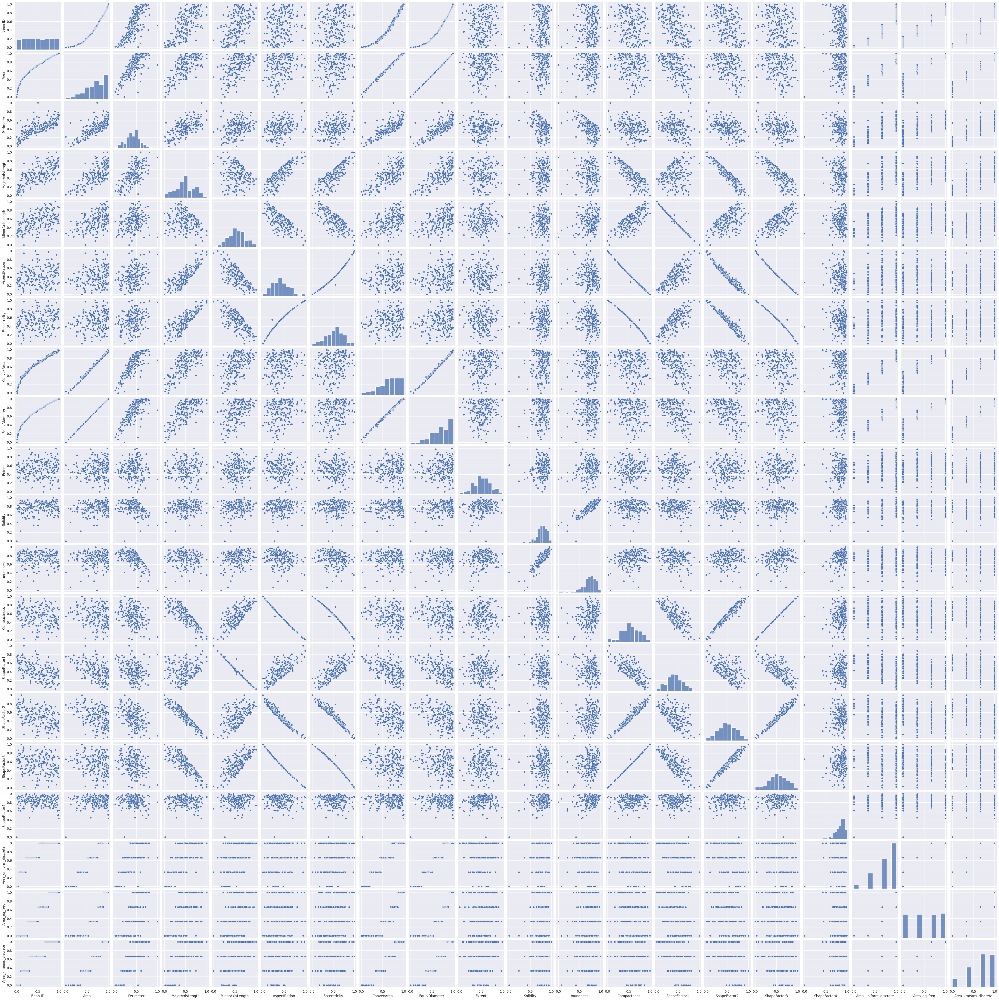

In [ ]:
sns.pairplot(filteredDataSet)

In [ ]:
filteredDataSet.describe()

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Area_uniform_discrete,Area_eq_freq,Area_kmeans_discrete
count,11713.000000,11713.000000,11713.000000,11713.000000,11713.000000,11713.000000,11713.000000,11713.000000,11713.000000,11713.000000,11713.000000,11713.000000,11713.000000,11713.000000,11713.000000,11713.000000,11713.000000,11713.000000,11713.000000,11713.000000
mean,0.543099,0.359365,0.387486,0.404245,0.467834,0.456896,0.607757,0.358872,0.433875,0.591682,0.901360,0.785728,0.460488,0.359637,0.363785,0.427114,0.909843,0.313612,0.500071,0.378468
std,0.279909,0.213655,0.203711,0.206514,0.191109,0.211697,0.225637,0.214399,0.215491,0.163709,0.062054,0.114259,0.198515,0.167479,0.202830,0.195295,0.083788,0.298562,0.372681,0.342171
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.316881,0.197976,0.226702,0.229786,0.330982,0.317284,0.490286,0.196677,0.272054,0.479614,0.881441,0.708493,0.334635,0.240747,0.171257,0.299056,0.885783,0.000000,0.333333,0.000000
50%,0.568812,0.304197,0.339873,0.355674,0.439773,0.424466,0.624831,0.302925,0.393466,0.616447,0.917023,0.807549,0.474560,0.360479,0.363128,0.434715,0.935569,0.333333,0.666667,0.333333
75%,0.784480,0.501802,0.556715,0.586136,0.582848,0.572252,0.763462,0.502721,0.592140,0.721322,0.939527,0.870823,0.584680,0.470600,0.524246,0.545887,0.962480,0.666667,1.000000,0.666667
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
df_normalised

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Area_uniform_discrete,Area_eq_freq,Area_kmeans_discrete
0,0.000000,0.137960,0.143451,0.093699,0.413202,0.000000,0.618695,0.136799,0.197171,0.644745,0.930410,0.977389,1.000000,0.380751,0.966357,1.000000,0.988093,0.000000,0.000000,0.000000
1,0.000588,0.143846,0.168806,0.147107,0.341905,0.171108,0.230771,0.143427,0.204754,0.636786,0.905363,0.886977,0.760170,0.454326,0.720882,0.731038,0.988118,0.000000,0.000000,0.000000
2,0.000662,0.144334,0.169727,0.169542,0.314165,0.246751,0.378736,0.142973,0.205379,0.564096,0.935943,0.885103,0.661460,0.490818,0.632299,0.625677,0.908522,0.000000,0.000000,0.000000
3,0.001030,0.146078,0.150107,0.128815,0.376785,0.098676,0.049827,0.143515,0.207614,0.678734,0.974748,0.984983,0.856488,0.416696,0.808758,0.836847,0.996275,0.000000,0.000000,0.000000
4,0.001177,0.146232,0.176251,0.125268,0.383091,0.085617,0.011746,0.146318,0.207811,0.682111,0.888832,0.864809,0.874539,0.410265,0.826113,0.857006,0.995607,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11708,0.999706,0.277985,0.300531,0.335313,0.409219,0.420551,0.620503,0.275517,0.364646,0.472358,0.946135,0.876226,0.481564,0.385458,0.378820,0.441670,0.974552,0.333333,0.333333,0.333333
11709,0.999779,0.278036,0.297721,0.312521,0.439982,0.342517,0.525193,0.275341,0.364703,0.769443,0.951731,0.887333,0.560649,0.356315,0.433165,0.521288,0.971350,0.333333,0.333333,0.333333
11710,0.999853,0.278524,0.300052,0.312405,0.443045,0.338571,0.519867,0.276287,0.365245,0.525804,0.940379,0.879963,0.562502,0.355136,0.434133,0.523177,0.943450,0.333333,0.333333,0.333333
11711,0.999926,0.278626,0.305754,0.318282,0.437160,0.355698,0.542605,0.277525,0.365359,0.440393,0.912613,0.858380,0.542050,0.362397,0.419728,0.502384,0.913754,0.333333,0.333333,0.333333


#Model building

In [ ]:
X = filteredDataSet.drop(["Class"], axis=1)
y= filteredDataSet["Class"]
y


0           SEKER
1           SEKER
2           SEKER
3           SEKER
4           SEKER
           ...   
11708    DERMASON
11709    DERMASON
11710    DERMASON
11711    DERMASON
11712    DERMASON
Name: Class, Length: 11713, dtype: object

In [ ]:
# Split X and y into training and test set in 80:20 ratio
X_train1,X_test1,y_train1,y_test1=train_test_split(X,y,test_size=0.2,random_state=1)
columns1=X_train1.columns
print("Train-Set-1 :" + str(X_train1.shape))
print("Test-Set-1:" + str(X_test1.shape))

Train-Set-1 :(9370, 20)
Test-Set-1:(2343, 20)


In [ ]:
# Split X and y into training and test set in 10:90 ratio
X_train2,X_test2,y_train2,y_test2=train_test_split(X,y,test_size=0.9,random_state=1)
columns2=X_train2.columns
print("Train-Set-2 :" + str(X_train2.shape))
print("Test-Set-2:" + str(X_test2.shape))

Train-Set-2 :(1171, 20)
Test-Set-2:(10542, 20)


# Scaling

In [ ]:
scaler=StandardScaler()
scaler.fit(X_train1)
X_train1 = scaler.transform(X_train1)
X_test1 = scaler.transform(X_test1)

#Managing the imbalance class

In [ ]:
Ov_sampling=SMOTE(random_state=0)

# now use SMOTE to oversample our train data which have features data_train_X and labels in data_train_y
ov_data_X,ov_data_y=Ov_sampling.fit_resample=(X_train1 ,y_train1)
ov_data_X=pd.DataFrame(data=ov_data_X,columns=columns1)
ov_data_y=pd.DataFrame(ov_data_y,columns=['Class'])

ov_data_X2,ov_data_y2=Ov_sampling.fit_resample=(X_train2 ,y_train2)
ov_data_X2=pd.DataFrame(data=ov_data_X2,columns=columns2)
ov_data_y2=pd.DataFrame(ov_data_y2,columns=['Class'])

In [ ]:
print("Case 1: Train = 80% , Test = 20%")
print('length of oversampled data is   ', len(ov_data_X))
print('Number of no subscription in oversampled data ', len(ov_data_y[ov_data_y['Class']==0]))
print('Number of subscription ', len(ov_data_y[ov_data_y['Class']==1]))
print('Proportion of no subscription data in oversampled data is ', len(ov_data_y[ov_data_y['Class']==0])/len(ov_data_X))
print('Proportion of subscription data in oversampled data is ', len(ov_data_y[ov_data_y['Class']==1])/len(ov_data_X))
print("\n\n")

print("Case 2: Train = 10%, Test = 90%")
print('length of oversampled data is   ', len(ov_data_X2))
print('Number of no subscription in oversampled data ', len(ov_data_y2[ov_data_y2['Class']==0]))
print('Number of subscription ', len(ov_data_y2[ov_data_y2['Class']==1]))
print('Proportion of no subscription data in oversampled data is ', len(ov_data_y2[ov_data_y2['Class']==0])/len(ov_data_X2))
print('Proportion of subscription data in oversampled data is ', len(ov_data_y2[ov_data_y2['Class']==1])/len(ov_data_X2))


Case 1: Train = 80% , Test = 20%
length of oversampled data is    9370
Number of no subscription in oversampled data  0
Number of subscription  0
Proportion of no subscription data in oversampled data is  0.0
Proportion of subscription data in oversampled data is  0.0



Case 2: Train = 10%, Test = 90%
length of oversampled data is    1171
Number of no subscription in oversampled data  0
Number of subscription  0
Proportion of no subscription data in oversampled data is  0.0
Proportion of subscription data in oversampled data is  0.0


#Naive Bayes Model

In [ ]:


model=GaussianNB()
model.fit(ov_data_X,ov_data_y)
pred = model.predict(X_test1)

print("Gaussian Naive Bayes model accuracy(in %):", metrics.accuracy_score(y_test1, pred)*100)

Gaussian Naive Bayes model accuracy(in %): 83.14127187366624


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  warnings.warn(


In [ ]:
model2=GaussianNB()
model2.fit(ov_data_X2,ov_data_y2)
pred2 = model2.predict(X_test2)

print("Gaussian Naive Bayes model accuracy(in %):", metrics.accuracy_score(y_test2, pred2)*100)

Gaussian Naive Bayes model accuracy(in %): 81.90096755833808


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [ ]:
9#Confusion matrix is a table that is often used to describe the performance of classification model(or classifier)
#on a set of test data for which the true values are known.
#Accuracy, precision recall and F1-score can be computed based on confusion matrix.
print("Case 1: Train = 80% , Test = 20%")
model_score = model.score(X_test1, y_test1)
print('Model score :', model_score)
print('Confusion Matrix:\n', metrics.confusion_matrix(y_test1,pred))
print(classification_report(y_test1,pred))


print("Case 2: Train = 10% , Test = 90%")
model_score2 = model2.score(X_test2, y_test2)
print('Model score :', model_score2)
print('Confusion Matrix:\n', metrics.confusion_matrix(y_test2, pred2))

print(classification_report(y_test2, pred2))

Case 1: Train = 80% , Test = 20%
Model score : 0.8759042849193099
Confusion Matrix:
 [[221  34   0   9   1   0]
 [  0 109   0   0   0   0]
 [ 12  61 268   0   0   0]
 [  8   0   0 383   0   0]
 [ 76   0   0   0 320   0]
 [  0   0   0  22   0 273]]
              precision    recall  f1-score   support

    BARBUNYA       0.70      0.83      0.76       265
      BOMBAY       0.53      1.00      0.70       109
        CALI       1.00      0.79      0.88       341
       HOROZ       0.93      0.98      0.95       391
       SEKER       1.00      0.81      0.89       396
        SIRA       1.00      0.93      0.96       295

    accuracy                           0.88      1797
   macro avg       0.86      0.89      0.86      1797
weighted avg       0.91      0.88      0.88      1797

Case 2: Train = 10% , Test = 90%
Model score : 0.8609599208312716
Confusion Matrix:
 [[ 980  170    0   36    9    0]
 [   0  472    0    0    0    0]
 [  50  274 1134    0    1    0]
 [  55    0    0 1685    

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning: X does not have valid feature names, but GaussianNB was fitted with feature names
  "X does not have valid feature names, but"


              precision    recall  f1-score   support

    BARBUNYA       0.67      0.82      0.74      1195
      BOMBAY       0.52      1.00      0.68       472
        CALI       1.00      0.78      0.87      1459
       HOROZ       0.90      0.97      0.93      1740
       SEKER       0.99      0.80      0.89      1830
        SIRA       1.00      0.88      0.94      1388

    accuracy                           0.86      8084
   macro avg       0.85      0.87      0.84      8084
weighted avg       0.90      0.86      0.87      8084



In [ ]:
print("Case 1: Train = 80% , Test = 20%")
print('Accuracy :', metrics.accuracy_score(y_test1, pred))
print('Precision :', metrics.precision_score(y_test1, pred, average="weighted"))
print('Recall :', metrics.recall_score(y_test1, pred, average="weighted"))
print('F-score :', metrics.f1_score(y_test1, pred, average="weighted"))
print("\n\n")
print("Case 1: Train = 10% , Test = 90%")
print('Accuracy :', metrics.accuracy_score(y_test2, pred2))
print('Precision :', metrics.precision_score(y_test2, pred2, average="weighted"))
print('Recall :', metrics.recall_score(y_test2, pred2, average="weighted"))
print('F-score :', metrics.f1_score(y_test2, pred2, average="weighted"))


Case 1: Train = 80% , Test = 20%
Accuracy : 0.8759042849193099
Precision : 0.9101148622761498
Recall : 0.8759042849193099
F-score : 0.8828046260722725



Case 1: Train = 10% , Test = 90%
Accuracy : 0.8609599208312716
Precision : 0.8995093388068446
Recall : 0.8609599208312716
F-score : 0.8688342492662492


#Logistic Regression

In [ ]:
filteredDataSet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8982 entries, 0 to 8981
Data columns (total 21 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Bean ID                8982 non-null   float64
 1   Area                   8982 non-null   float64
 2   Perimeter              8982 non-null   float64
 3   MajorAxisLength        8982 non-null   float64
 4   MinorAxisLength        8982 non-null   float64
 5   AspectRation           8982 non-null   float64
 6   Eccentricity           8982 non-null   float64
 7   ConvexArea             8982 non-null   float64
 8   EquivDiameter          8982 non-null   float64
 9   Extent                 8982 non-null   float64
 10  Solidity               8982 non-null   float64
 11  roundness              8982 non-null   float64
 12  Compactness            8982 non-null   float64
 13  ShapeFactor1           8982 non-null   float64
 14  ShapeFactor2           8982 non-null   float64
 15  Shap

In [ ]:
#Get target data
y = filteredDataSet["Class"]
X = filteredDataSet.drop(['Bean ID','Class'], axis=1)
print(X.head())
print(X.shape)

       Area  Perimeter  MajorAxisLength  MinorAxisLength  AspectRation  \
0  0.171787   0.201963         0.164110         0.311536      0.076696   
1  0.172369   0.203065         0.189138         0.275931      0.174139   
2  0.177744   0.198177         0.168593         0.323305      0.072224   
3  0.178357   0.221248         0.188013         0.292660      0.150486   
4  0.186872   0.202419         0.403168         0.325179      0.101947   

   Eccentricity  ConvexArea  EquivDiameter    Extent  Solidity  roundness  \
0      0.167259    0.171832       0.233324  0.611476  0.472697   0.771780   
1      0.337727    0.171287       0.234037  0.522314  0.645972   0.767758   
2      0.158416    0.176430       0.240598  0.686714  0.679889   0.852829   
3      0.299884    0.178426       0.241344  0.692816  0.469333   0.673350   
4      0.215354    0.184794       0.251658  0.686129  0.791110   0.894369   

   Compactness  ShapeFactor1  ShapeFactor2  ShapeFactor3  ShapeFactor4  \
0     0.894031    

In [ ]:
X.isnull().sum()

Area                     0
Perimeter                0
MajorAxisLength          0
MinorAxisLength          0
AspectRation             0
Eccentricity             0
ConvexArea               0
EquivDiameter            0
Extent                   0
Solidity                 0
roundness                0
Compactness              0
ShapeFactor1             0
ShapeFactor2             0
ShapeFactor3             0
ShapeFactor4             0
Area_uniform_discrete    0
Area_eq_freq             0
Area_kmeans_discrete     0
dtype: int64

#Build logistic regression

In [ ]:
logModel = LogisticRegression(max_iter=8000)
logModel.fit(X,y)

LogisticRegression(max_iter=8000)

In [ ]:
#Check Accuracy
print(f'Accuracy - : {logModel.score(X,y):.3f}')

Accuracy - : 0.814


# #K-fold cross validation

In [ ]:
# Create an instance of Pipeline
pipeline = make_pipeline(StandardScaler(), RandomForestClassifier(n_estimators=100, max_depth=4))
# Pass instance of pipeline and training and test data set
# cv=10 represents the StratifiedKFold with 10 folds
#
scores = cross_val_score(pipeline, X=X_train1, y=y_train1, cv=10, n_jobs=1)

print('Cross Validation accuracy scores: %s' % scores)

print('Cross Validation accuracy: %.3f +/- %.3f' % (np.mean(scores),np.std(scores)))

Cross Validation accuracy scores: [0.93880389 0.94853964 0.95410292 0.94714882 0.93741307 0.94428969
 0.94428969 0.94289694 0.94986072 0.94568245]
Cross Validation accuracy: 0.945 +/- 0.005




```
# This is formatted as code
```

# Regularization

In [ ]:
#Regularization is to control the over-fitting phenomenon.
#In this, a penalty term is added to the error function in order to discourage the coefficients from reaching large values.
clf = LogisticRegression(random_state=0).fit(X, y)
clf.score(X, y)

print(clf.predict(X[:2, :]))
print(clf.predict_proba(X[:2, :]))
print(clf.score(X, y))

[0 1]
[[0.96629558 0.03370442]
 [0.0049207  0.9950793 ]]
0.906
